# Open-Meteo Data Crawling — 6 Hanoi Stations

Crawl hourly weather data from the **Open-Meteo Archive API** (free, no API key needed)
for 6 stations in Hanoi. Station list is read from `data/raw/DataAOD/Hanoi/Stations.xlsx`;
coordinates are fetched automatically from the OpenAQ API.

**13 variables:** temperature, humidity, dew point, wind (speed/direction/gusts/u/v),
pressure, precipitation, rain, cloud cover, boundary-layer height.

Outputs saved to `data/raw/DataAOD/Hanoi/`.

## 1. Imports & Configuration

In [1]:
import time
from pathlib import Path

import numpy as np
import pandas as pd
import requests

# ── Paths ──────────────────────────────────────────────────────────────────────
PROJECT_ROOT  = Path("D:/Bussiness_plan/Multimodal_PM25")
STATIONS_FILE = PROJECT_ROOT / "data/raw/DataAOD/Hanoi/Stations.xlsx"
OUTPUT_DIR    = PROJECT_ROOT / "data/raw/DataAOD/Hanoi"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── API endpoints ──────────────────────────────────────────────────────────────
OPENMETEO_URL = "https://archive-api.open-meteo.com/v1/archive"
OPENAQ_URL    = "https://api.openaq.org/v3"
OPENAQ_KEY    = "8e8c3a875320048ecc88c70fcba8a72b10466adada7fb420c851038a59f3b987"

# ── Date range ─────────────────────────────────────────────────────────────────
GLOBAL_START = "2021-01-01"
GLOBAL_END   = "2026-05-15"

# ── Open-Meteo hourly variables ────────────────────────────────────────────────
HOURLY_VARS = [
    "temperature_2m",
    "relative_humidity_2m",
    "dew_point_2m",
    "wind_speed_10m",
    "wind_direction_10m",
    "wind_gusts_10m",
    "pressure_msl",
    "surface_pressure",
    "precipitation",
    "rain",
    "cloud_cover",
    "boundary_layer_height",   # PBL height — key for PM2.5 dispersion
    "visibility",              # proxy for air quality
]

COLUMN_RENAME = {
    "time":                  "datetime_utc",
    "temperature_2m":        "temperature_2m_C",
    "relative_humidity_2m":  "relative_humidity_pct",
    "dew_point_2m":          "dew_point_2m_C",
    "wind_speed_10m":        "wind_speed_10m_kmh",
    "wind_direction_10m":    "wind_direction_deg",
    "wind_gusts_10m":        "wind_gusts_10m_kmh",
    "pressure_msl":          "pressure_msl_hPa",
    "surface_pressure":      "surface_pressure_hPa",
    "precipitation":         "precipitation_mm",
    "rain":                  "rain_mm",
    "cloud_cover":           "cloud_cover_pct",
    "boundary_layer_height": "boundary_layer_height_m",
    "visibility":            "visibility_m",
}

FINAL_COLUMNS = [
    "datetime_utc", "location_id", "location_name", "latitude", "longitude",
    "temperature_2m_C", "relative_humidity_pct", "dew_point_2m_C",
    "wind_speed_10m_kmh", "wind_direction_deg", "wind_gusts_10m_kmh",
    "wind_u_10m", "wind_v_10m",
    "pressure_msl_hPa", "surface_pressure_hPa",
    "precipitation_mm", "rain_mm", "cloud_cover_pct",
    "boundary_layer_height_m", "visibility_m",
    "temp_x_rh", "wind_x_rain",
]

print("Config loaded.")
print(f"  Stations file : {STATIONS_FILE}")
print(f"  Output dir    : {OUTPUT_DIR}")
print(f"  Date range    : {GLOBAL_START}  →  {GLOBAL_END}")
print(f"  Variables     : {len(HOURLY_VARS)} hourly vars + 2 derived")


Config loaded.
  Stations file : D:\Bussiness_plan\Multimodal_PM25\data\raw\DataAOD\Hanoi\Stations.xlsx
  Output dir    : D:\Bussiness_plan\Multimodal_PM25\data\raw\DataAOD\Hanoi
  Date range    : 2021-01-01  →  2026-05-15
  Variables     : 13 hourly vars + 2 derived


## 2. Helper Functions

In [2]:
def request_json(url, params=None, headers=None, timeout=60, max_retries=6):
    last_exc = None
    for attempt in range(max_retries):
        try:
            resp = requests.get(url, params=params, headers=headers, timeout=timeout)
            if resp.status_code == 429:
                raw = resp.headers.get("x-ratelimit-reset", "")
                try:
                    v = float(raw)
                    wait = max(v - time.time(), 1) if v > 1e9 else max(v, 5)
                except (ValueError, TypeError):
                    wait = 60
                sleep_s = wait + 3
                print(f"  429 rate-limit → sleep {sleep_s:.0f}s (attempt {attempt+1})")
                time.sleep(sleep_s)
                continue
            if resp.status_code in {408, 500, 502, 503, 504}:
                sleep_s = min(60, 2 ** attempt + 1)
                print(f"  {resp.status_code} error → retry in {sleep_s:.0f}s")
                time.sleep(sleep_s)
                continue
            resp.raise_for_status()
            return resp.json()
        except requests.RequestException as e:
            last_exc = e
            if attempt == max_retries - 1:
                raise
            time.sleep(min(30, 2 ** attempt))
    raise RuntimeError(f'Exhausted {max_retries} retries for {url}: {last_exc}')


def get_station_coords(location_id: int) -> dict:
    """Fetch lat/lon and timezone from OpenAQ API."""
    payload = request_json(
        f"{OPENAQ_URL}/locations/{location_id}",
        headers={"X-API-Key": OPENAQ_KEY},
    )
    results = payload.get("results", [])
    if not results:
        raise ValueError(f'Location {location_id} not found in OpenAQ')
    loc    = results[0]
    coords = loc.get("coordinates") or {}
    return {
        "location_name": loc.get("name"),
        "latitude":      coords.get("latitude"),
        "longitude":     coords.get("longitude"),
        "timezone":      loc.get("timezone", "GMT"),
    }


def fetch_openmeteo(latitude, longitude, start_date, end_date) -> pd.DataFrame:
    """Call Open-Meteo Archive API and return a tidy DataFrame."""
    params = {
        "latitude":     latitude,
        "longitude":    longitude,
        "start_date":   start_date,
        "end_date":     end_date,
        "hourly":       ",".join(HOURLY_VARS),
        "timezone":     "GMT",
        "timeformat":   "iso8601",
        "cell_selection": "land",
    }
    payload = request_json(OPENMETEO_URL, params=params)
    hourly  = payload.get("hourly", {})
    if not hourly or "time" not in hourly:
        return pd.DataFrame()
    df = pd.DataFrame(hourly).rename(columns=COLUMN_RENAME)
    df["datetime_utc"] = pd.to_datetime(df["datetime_utc"], utc=True, errors="coerce")
    return df


def add_derived_features(df: pd.DataFrame) -> pd.DataFrame:
    """Add wind components and interaction features."""
    theta = np.deg2rad(df["wind_direction_deg"])
    # Meteorological convention: u negative when wind blows east→west
    df["wind_u_10m"]  = -df["wind_speed_10m_kmh"] * np.sin(theta)
    df["wind_v_10m"]  = -df["wind_speed_10m_kmh"] * np.cos(theta)
    df["temp_x_rh"]   = df["temperature_2m_C"] * df["relative_humidity_pct"]
    df["wind_x_rain"] = df["wind_speed_10m_kmh"] * df["rain_mm"]
    return df


print("Helpers defined.")


Helpers defined.


## 3. Load Stations & Fetch Coordinates

In [3]:
df_raw = pd.read_excel(STATIONS_FILE)
df_raw.columns = [str(c).strip() for c in df_raw.columns]

df_stations = pd.DataFrame({
    "location_id":   df_raw["Location"].astype(int),
    "location_name": df_raw["Name"].str.strip(),
})

# Fetch lat/lon from OpenAQ for each station
print("Fetching coordinates from OpenAQ...")
coords_list = []
for _, row in df_stations.iterrows():
    loc_id = int(row['location_id'])
    try:
        c = get_station_coords(loc_id)
        coords_list.append({
            "location_id":   loc_id,
            "location_name": c["location_name"],
            "latitude":      c["latitude"],
            "longitude":     c["longitude"],
        })
        nm = c["location_name"]; la = c["latitude"]; lo = c["longitude"]
        print(f"  {loc_id}: {nm}  lat={la}, lon={lo}")
    except Exception as e:
        print(f"  {loc_id}: ERROR — {e}")
    time.sleep(0.5)

df_stations = pd.DataFrame(coords_list)
df_stations["start_date"] = GLOBAL_START
df_stations["end_date"]   = GLOBAL_END

print(f"\nReady to crawl {len(df_stations)} stations:")
display(df_stations)


Fetching coordinates from OpenAQ...

  18: SPARTAN - Vietnam Acad. Sci.  lat=21.048, lon=105.8


  2539: US Diplomatic Post: Hanoi  lat=21.02177, lon=105.819002


  7441: Hanoi  lat=21.021939, lon=105.818806


  307169: nồng độ pm  lat=21.027764483, lon=105.834159739


  1285357: SPARTAN - Vietnam Acad. Sci.  lat=21.0478, lon=105.8


  2161290: An Khánh  lat=21.0024, lon=105.7181


  2161291: Cầu Diễn  lat=21.0398, lon=105.7652


  2161292: Số 46, phố Lưu Quang Vũ  lat=21.0152, lon=105.7999


  2161293: Chúc Sơn  lat=20.92, lon=105.7123


  2161294: Cung thiếu nhi  lat=21.0284, lon=105.8556


  2161295: Đầm Trấu  lat=21.0119, lon=105.8644


  2161296: Đào Duy Từ  lat=21.0354, lon=105.8529


  2161298: Đông Kinh Nghĩa Thục  lat=21.032, lon=105.8515


  2161299: Hàng Đậu  lat=21.0399, lon=105.8473


  2161300: Hoàn Kiếm  lat=21.0263, lon=105.8515


  2161301: Khương Trung  lat=20.9949, lon=105.8167


  2161303: Kim Liên  lat=21.0074, lon=105.8358


  2161304: Lê Trực  lat=21.0327, lon=105.8329


  2161306: Minh Khai - Bắc Từ Liêm  lat=21.05, lon=105.74


  2161307: Mỹ Đình  lat=21.0269, lon=105.7731


  2161308: Phạm Văn Đồng  lat=21.05, lon=105.782


  2161309: Pháp Vân  lat=20.9481, lon=105.8493


  2161313: Tân Mai  lat=20.9883, lon=105.8549


  2161314: Tây Hồ Tây  lat=21.0563, lon=105.7974


  2161315: Tây Mỗ  lat=21.0058, lon=105.7485


  2161316: Thành Công  lat=21.0197, lon=105.8147


  2161318: Tứ Liên  lat=21.0639, lon=105.8338


  2161320: Vân Hà  lat=21.1476, lon=105.9159


  2161321: Văn Quán  lat=20.972, lon=105.7856


  2161322: Võng La  lat=21.1105, lon=105.7605


  4946811: 556 Nguyễn Văn Cừ  lat=21.0491, lon=105.8831


  4946812: Công viên Nhân Chính - Khuất Duy Tiến  lat=21.0031, lon=105.79470000000002


  4946813: Số 1 đường Giải Phóng - phường Bạch Mai - ĐHBK   lat=21.0052, lon=105.8418


  6123215: OceanPark  lat=20.9933, lon=105.9441



Ready to crawl 34 stations:


,location_id,location_name,latitude,longitude,start_date,end_date
0,18,SPARTAN - Vietnam Acad. Sci.,21.048000,105.800000,2021-01-01,2026-05-15
1,2539,US Diplomatic Post: Hanoi,21.021770,105.819002,2021-01-01,2026-05-15
2,7441,Hanoi,21.021939,105.818806,2021-01-01,2026-05-15
3,307169,nồng độ pm,21.027764,105.834160,2021-01-01,2026-05-15
4,1285357,SPARTAN - Vietnam Acad. Sci.,21.047800,105.800000,2021-01-01,2026-05-15
5,2161290,An Khánh,21.002400,105.718100,2021-01-01,2026-05-15
6,2161291,Cầu Diễn,21.039800,105.765200,2021-01-01,2026-05-15
7,2161292,"Số 46, phố Lưu Quang Vũ",21.015200,105.799900,2021-01-01,2026-05-15
8,2161293,Chúc Sơn,20.920000,105.712300,2021-01-01,2026-05-15
9,2161294,Cung thiếu nhi,21.028400,105.855600,2021-01-01,2026-05-15


## 4. Crawl Open-Meteo for All Stations

In [4]:
all_frames = []

for _, row in df_stations.iterrows():
    loc_id   = int(row['location_id'])
    loc_name = str(row['location_name']).strip()
    lat      = float(row['latitude'])
    lon      = float(row['longitude'])
    start    = str(row['start_date'])
    end      = str(row['end_date'])

    print(f"\n{'='*60}")
    print(f"Station {loc_id}: {loc_name}")
    print(f"  Coords : {lat}, {lon}")
    print(f"  Range  : {start}  →  {end}")

    try:
        df_w = fetch_openmeteo(lat, lon, start, end)
    except Exception as e:
        print(f"  [SKIP] fetch error: {e}")
        continue

    if df_w.empty:
        print("  [SKIP] Empty response from Open-Meteo.")
        continue

    df_w["location_id"]   = loc_id
    df_w["location_name"] = loc_name
    df_w["latitude"]      = lat
    df_w["longitude"]     = lon

    df_w = add_derived_features(df_w)

    for c in FINAL_COLUMNS:
        if c not in df_w.columns:
            df_w[c] = pd.NA
    df_w = df_w[FINAL_COLUMNS].sort_values('datetime_utc').reset_index(drop=True)

    # Save per-station CSV
    safe = loc_name.replace('/', '_').replace('\\', '_').replace(',', '').replace('.', '').strip()
    out_csv = OUTPUT_DIR / f"{loc_id}_{safe}_openmeteo_hourly.csv"
    df_w.to_csv(out_csv, index=False, encoding='utf-8-sig')
    print(f"  Saved : {out_csv.name}  shape={df_w.shape}")
    print(f"  Non-null BLH  : {df_w['boundary_layer_height_m'].notna().sum()} rows")
    print(f"  Non-null PM2.5 proxy (visibility): {df_w['visibility_m'].notna().sum()} rows")

    all_frames.append(df_w)
    time.sleep(1)  # be polite

# ── Combined file ──────────────────────────────────────────────────────────────
print(f"\n{'='*60}")
if all_frames:
    df_all = (
        pd.concat(all_frames, ignore_index=True)
        .sort_values(['location_id', 'datetime_utc'])
        .reset_index(drop=True)
    )
    out_all = OUTPUT_DIR / 'all_stations_openmeteo_hourly.csv'
    df_all.to_csv(out_all, index=False, encoding='utf-8-sig')
    print(f"Combined: {out_all.name}  shape={df_all.shape}")
    display(
        df_all.groupby('location_id').agg(
            name   =('location_name', 'first'),
            rows   =('datetime_utc',  'count'),
            start  =('datetime_utc',  'min'),
            end    =('datetime_utc',  'max'),
        )
    )
    display(df_all.head(5))
else:
    print("No data collected.")



Station 18: SPARTAN - Vietnam Acad. Sci.
  Coords : 21.048, 105.8
  Range  : 2021-01-01  →  2026-05-15


  Saved : 18_SPARTAN - Vietnam Acad Sci_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2539: US Diplomatic Post: Hanoi
  Coords : 21.02177, 105.819002
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2539_US Diplomatic Post: Hanoi_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 7441: Hanoi
  Coords : 21.021939, 105.818806
  Range  : 2021-01-01  →  2026-05-15


  Saved : 7441_Hanoi_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 307169: nồng độ pm
  Coords : 21.027764483, 105.834159739
  Range  : 2021-01-01  →  2026-05-15


  Saved : 307169_nồng độ pm_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 1285357: SPARTAN - Vietnam Acad. Sci.
  Coords : 21.0478, 105.8
  Range  : 2021-01-01  →  2026-05-15


  Saved : 1285357_SPARTAN - Vietnam Acad Sci_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161290: An Khánh
  Coords : 21.0024, 105.7181
  Range  : 2021-01-01  →  2026-05-15


  429 rate-limit → sleep 63s (attempt 1)


  Saved : 2161290_An Khánh_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161291: Cầu Diễn
  Coords : 21.0398, 105.7652
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161291_Cầu Diễn_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161292: Số 46, phố Lưu Quang Vũ
  Coords : 21.0152, 105.7999
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161292_Số 46 phố Lưu Quang Vũ_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161293: Chúc Sơn
  Coords : 20.92, 105.7123
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161293_Chúc Sơn_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161294: Cung thiếu nhi
  Coords : 21.0284, 105.8556
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161294_Cung thiếu nhi_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161295: Đầm Trấu
  Coords : 21.0119, 105.8644
  Range  : 2021-01-01  →  2026-05-15


  429 rate-limit → sleep 63s (attempt 1)


  Saved : 2161295_Đầm Trấu_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161296: Đào Duy Từ
  Coords : 21.0354, 105.8529
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161296_Đào Duy Từ_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161298: Đông Kinh Nghĩa Thục
  Coords : 21.032, 105.8515
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161298_Đông Kinh Nghĩa Thục_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161299: Hàng Đậu
  Coords : 21.0399, 105.8473
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161299_Hàng Đậu_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161300: Hoàn Kiếm
  Coords : 21.0263, 105.8515
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161300_Hoàn Kiếm_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161301: Khương Trung
  Coords : 20.9949, 105.8167
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161301_Khương Trung_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161303: Kim Liên
  Coords : 21.0074, 105.8358
  Range  : 2021-01-01  →  2026-05-15


  429 rate-limit → sleep 63s (attempt 1)


  Saved : 2161303_Kim Liên_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161304: Lê Trực
  Coords : 21.0327, 105.8329
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161304_Lê Trực_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161306: Minh Khai - Bắc Từ Liêm
  Coords : 21.05, 105.74
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161306_Minh Khai - Bắc Từ Liêm_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161307: Mỹ Đình
  Coords : 21.0269, 105.7731
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161307_Mỹ Đình_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161308: Phạm Văn Đồng
  Coords : 21.05, 105.782
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161308_Phạm Văn Đồng_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161309: Pháp Vân
  Coords : 20.9481, 105.8493
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161309_Pháp Vân_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161313: Tân Mai
  Coords : 20.9883, 105.8549
  Range  : 2021-01-01  →  2026-05-15


  429 rate-limit → sleep 63s (attempt 1)


  Saved : 2161313_Tân Mai_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161314: Tây Hồ Tây
  Coords : 21.0563, 105.7974
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161314_Tây Hồ Tây_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161315: Tây Mỗ
  Coords : 21.0058, 105.7485
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161315_Tây Mỗ_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161316: Thành Công
  Coords : 21.0197, 105.8147
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161316_Thành Công_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161318: Tứ Liên
  Coords : 21.0639, 105.8338
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161318_Tứ Liên_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161320: Vân Hà
  Coords : 21.1476, 105.9159
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161320_Vân Hà_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161321: Văn Quán
  Coords : 20.972, 105.7856
  Range  : 2021-01-01  →  2026-05-15


  429 rate-limit → sleep 63s (attempt 1)


  Saved : 2161321_Văn Quán_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 2161322: Võng La
  Coords : 21.1105, 105.7605
  Range  : 2021-01-01  →  2026-05-15


  Saved : 2161322_Võng La_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 4946811: 556 Nguyễn Văn Cừ
  Coords : 21.0491, 105.8831
  Range  : 2021-01-01  →  2026-05-15


  Saved : 4946811_556 Nguyễn Văn Cừ_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 4946812: Công viên Nhân Chính - Khuất Duy Tiến
  Coords : 21.0031, 105.79470000000002
  Range  : 2021-01-01  →  2026-05-15


  Saved : 4946812_Công viên Nhân Chính - Khuất Duy Tiến_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 4946813: Số 1 đường Giải Phóng - phường Bạch Mai - ĐHBK
  Coords : 21.0052, 105.8418
  Range  : 2021-01-01  →  2026-05-15


  Saved : 4946813_Số 1 đường Giải Phóng - phường Bạch Mai - ĐHBK_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows



Station 6123215: OceanPark
  Coords : 20.9933, 105.9441
  Range  : 2021-01-01  →  2026-05-15


  Saved : 6123215_OceanPark_openmeteo_hourly.csv  shape=(47064, 22)
  Non-null BLH  : 42696 rows
  Non-null PM2.5 proxy (visibility): 0 rows


Combined: all_stations_openmeteo_hourly.csv  shape=(1600176, 22)


,name,rows,start,end
location_id,,,,
18,SPARTAN - Vietnam Acad. Sci.,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
2539,US Diplomatic Post: Hanoi,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
7441,Hanoi,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
307169,nồng độ pm,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
1285357,SPARTAN - Vietnam Acad. Sci.,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
2161290,An Khánh,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
2161291,Cầu Diễn,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
2161292,"Số 46, phố Lưu Quang Vũ",47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00
2161293,Chúc Sơn,47064,2021-01-01 00:00:00+00:00,2026-05-15 23:00:00+00:00


,datetime_utc,location_id,location_name,latitude,longitude,temperature_2m_C,relative_humidity_pct,dew_point_2m_C,wind_speed_10m_kmh,wind_direction_deg,...,wind_v_10m,pressure_msl_hPa,surface_pressure_hPa,precipitation_mm,rain_mm,cloud_cover_pct,boundary_layer_height_m,visibility_m,temp_x_rh,wind_x_rain
0,2021-01-01 00:00:00+00:00,18,SPARTAN - Vietnam Acad. Sci.,21.048,105.8,8.7,56,0.4,13.2,26,...,-11.864081,1028.2,1026.8,0.0,0.0,69,110.0,None,487.2,0.0
1,2021-01-01 01:00:00+00:00,18,SPARTAN - Vietnam Acad. Sci.,21.048,105.8,10.4,46,-0.9,14.7,25,...,-13.322724,1028.8,1027.4,0.0,0.0,5,445.0,None,478.4,0.0
2,2021-01-01 02:00:00+00:00,18,SPARTAN - Vietnam Acad. Sci.,21.048,105.8,12.0,38,-2.1,14.8,26,...,-13.302152,1029.4,1028.0,0.0,0.0,72,570.0,None,456.0,0.0
3,2021-01-01 03:00:00+00:00,18,SPARTAN - Vietnam Acad. Sci.,21.048,105.8,13.4,34,-2.2,11.9,25,...,-10.785063,1029.2,1027.9,0.0,0.0,79,685.0,None,455.6,0.0
4,2021-01-01 04:00:00+00:00,18,SPARTAN - Vietnam Acad. Sci.,21.048,105.8,14.8,32,-1.9,10.0,21,...,-9.335804,1028.3,1027.0,0.0,0.0,37,850.0,None,473.6,0.0


## 5. Quick EDA

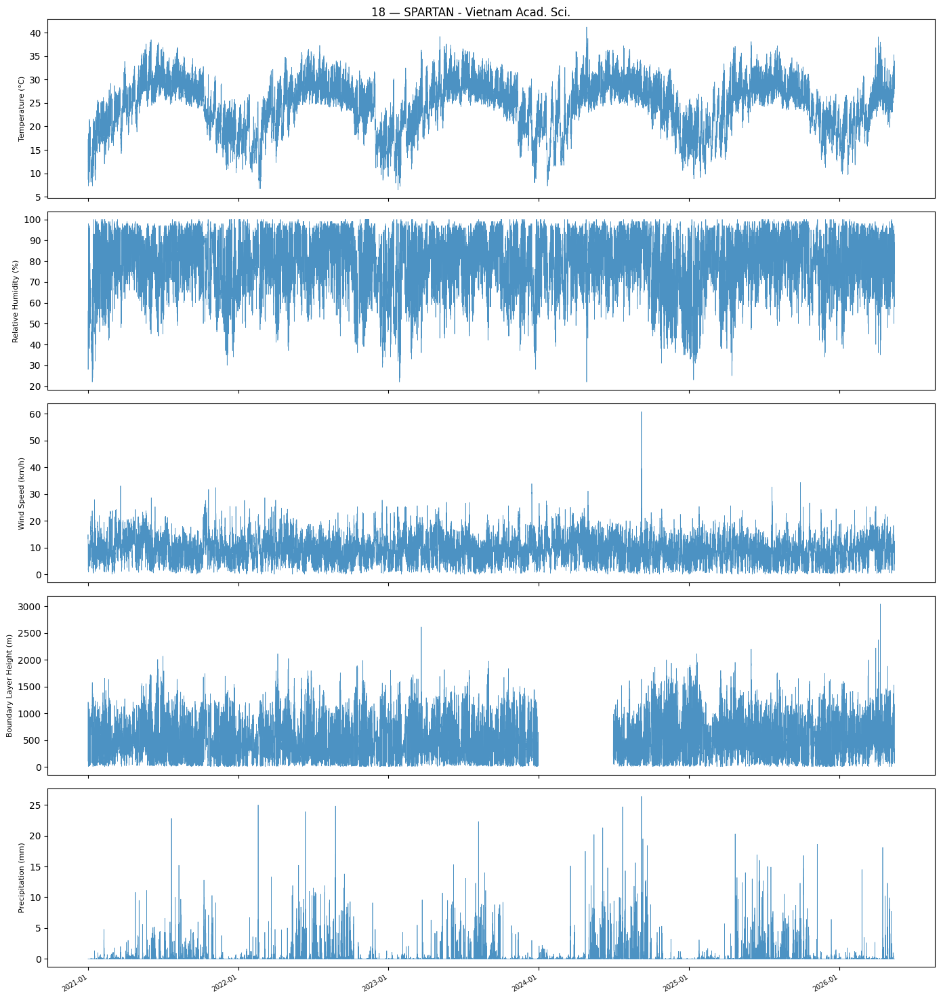

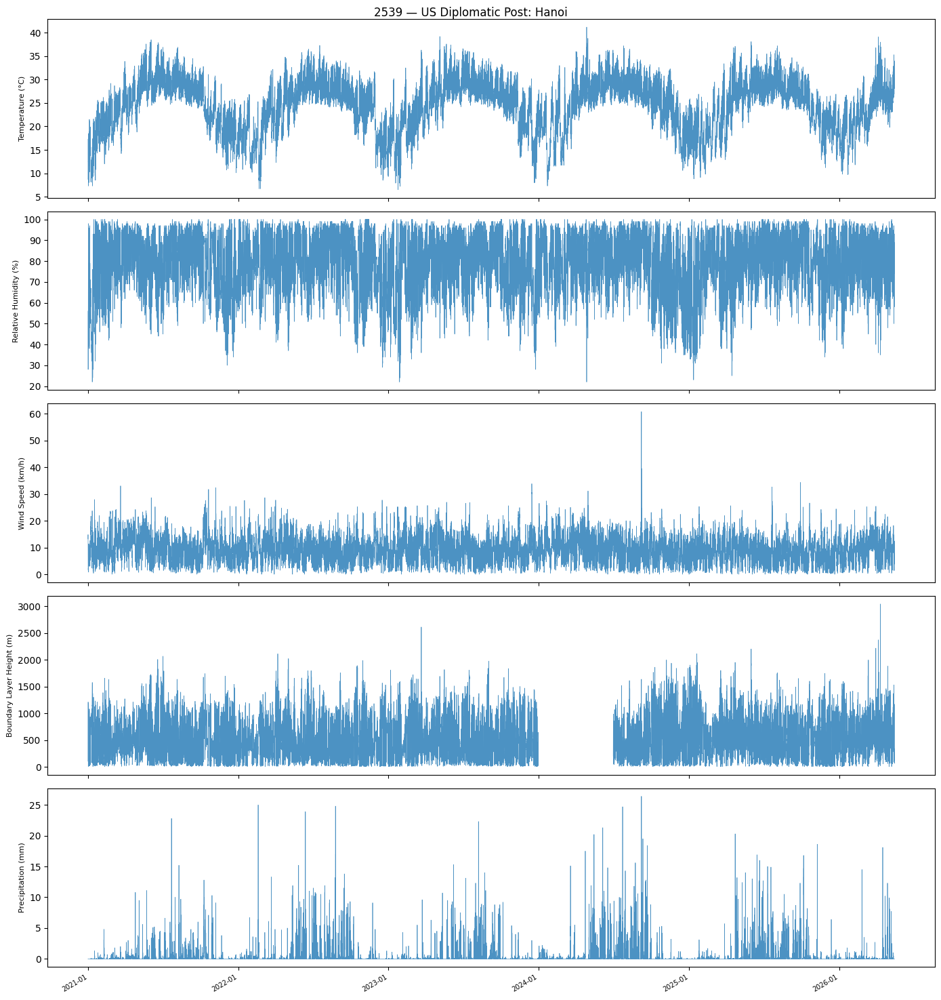

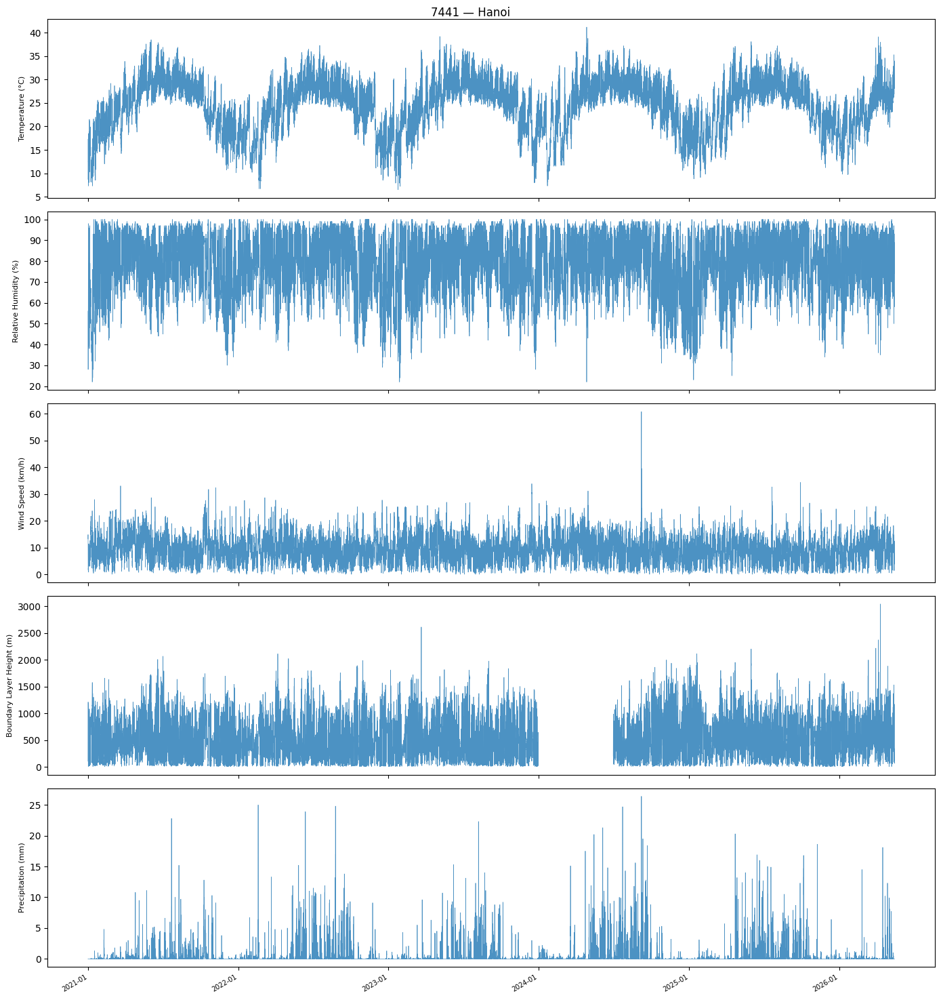

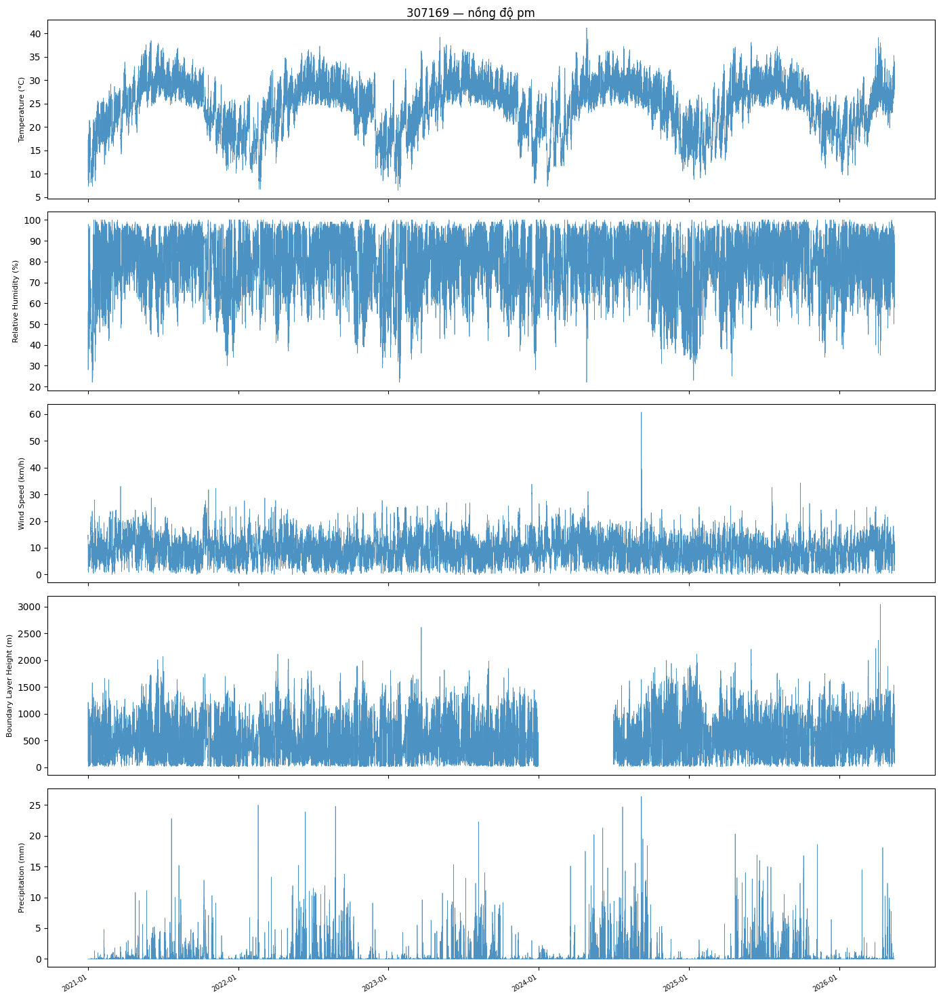

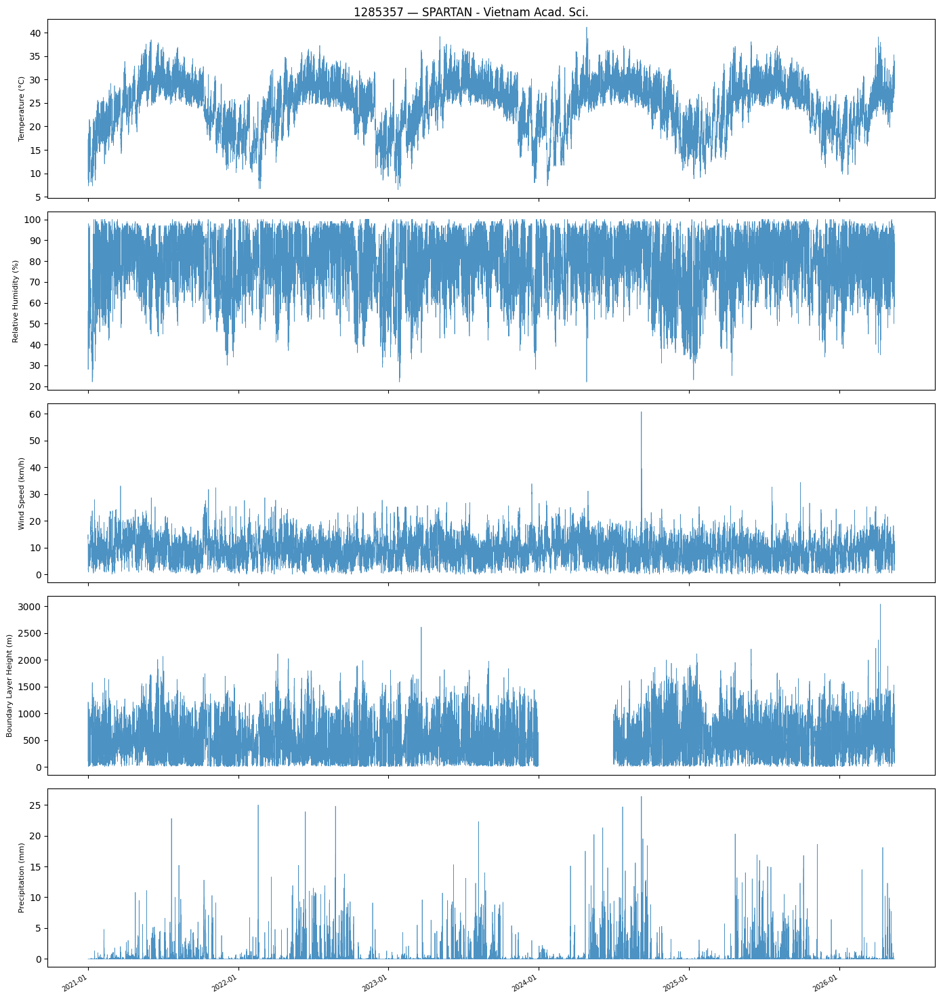

...

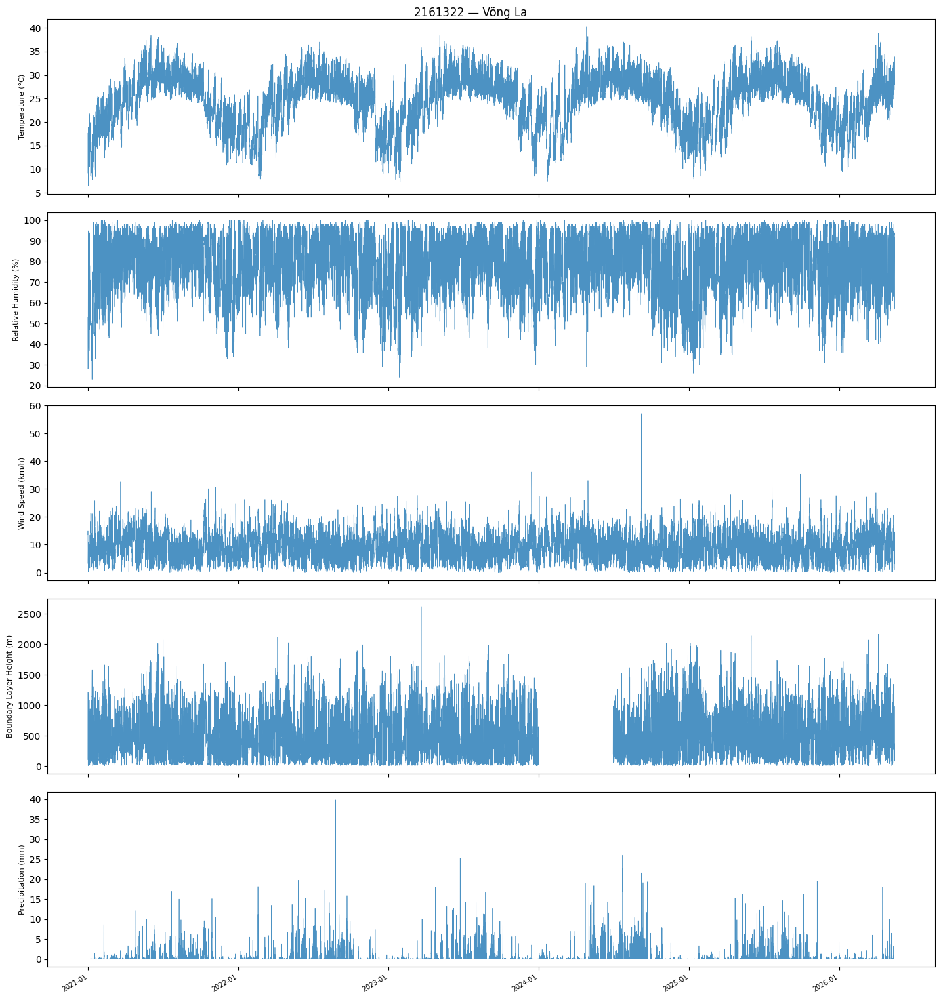

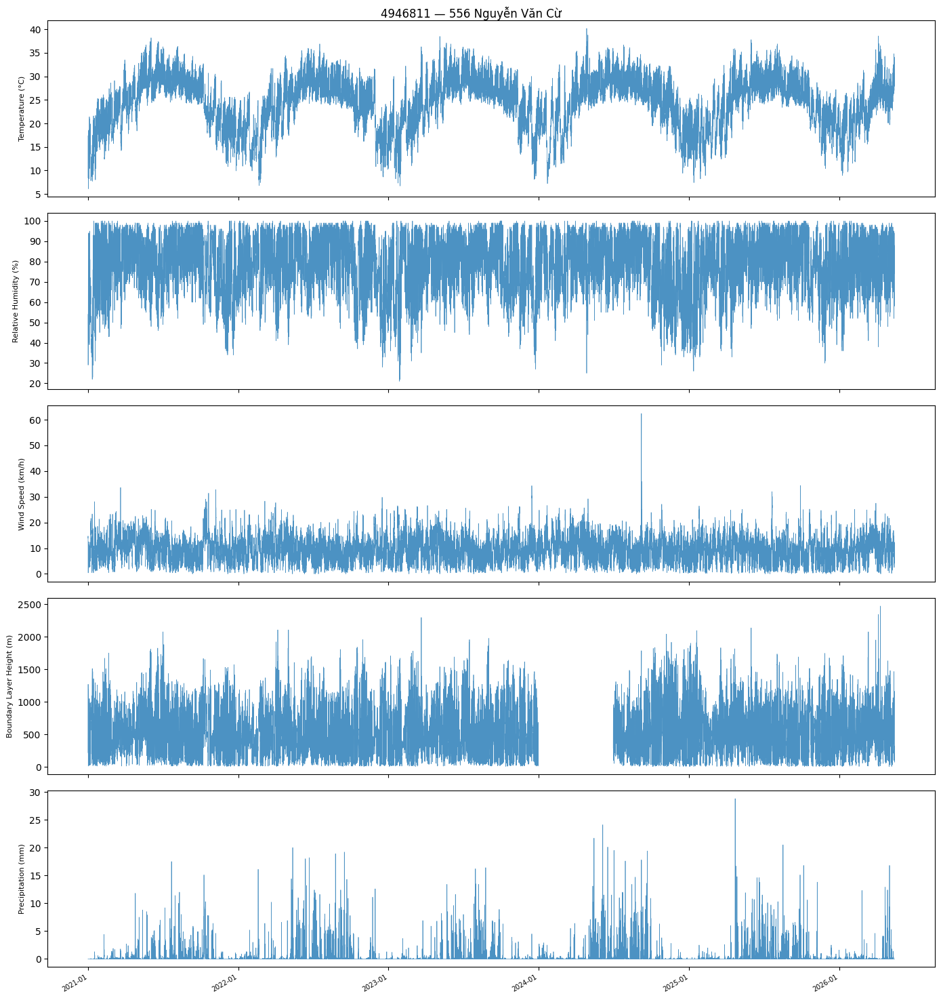

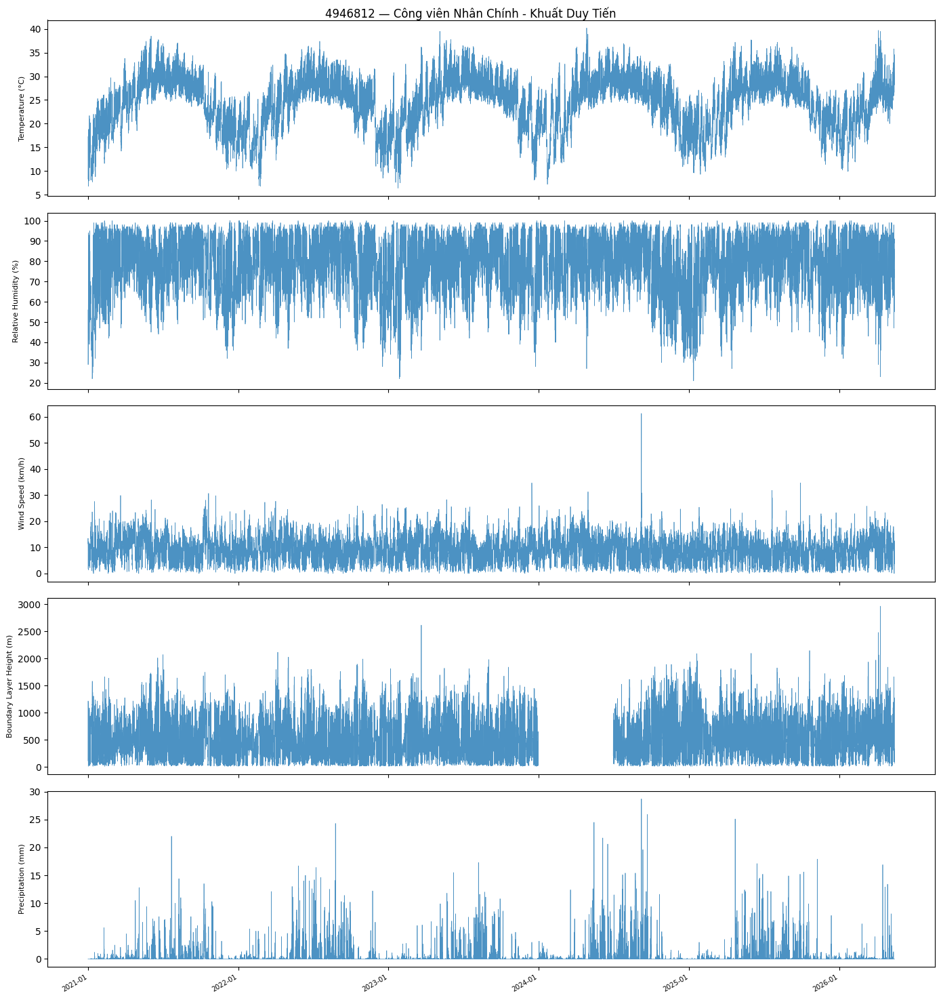

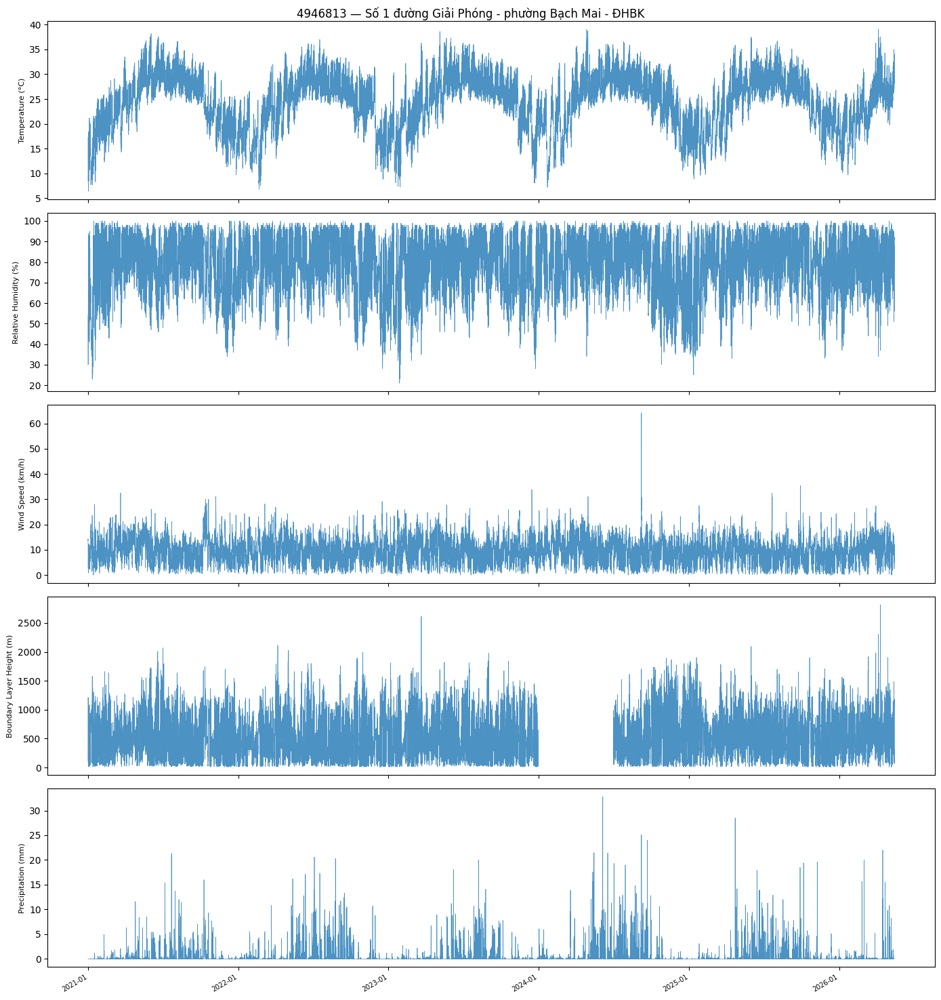

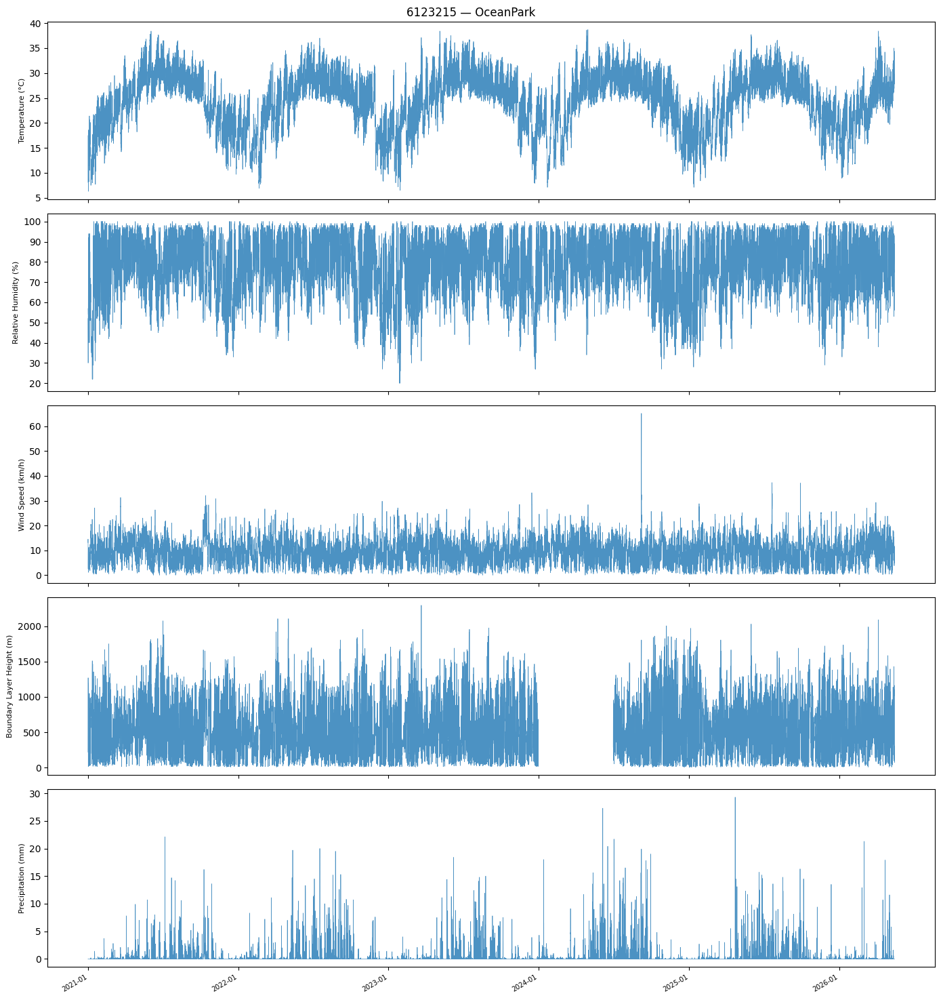

In [5]:
if all_frames:
    import matplotlib.pyplot as plt
    import matplotlib.dates as mdates

    PLOT_VARS = [
        ("temperature_2m_C",        "Temperature (°C)"),
        ("relative_humidity_pct",    "Relative Humidity (%)"),
        ("wind_speed_10m_kmh",       "Wind Speed (km/h)"),
        ("boundary_layer_height_m",  "Boundary Layer Height (m)"),
        ("precipitation_mm",         "Precipitation (mm)"),
    ]

    for loc_id, grp in df_all.groupby('location_id'):
        grp = grp.sort_values('datetime_utc')
        fig, axes = plt.subplots(len(PLOT_VARS), 1, figsize=(14, 3*len(PLOT_VARS)), sharex=True)
        fig.suptitle(f"{loc_id} — {grp['location_name'].iloc[0]}", fontsize=12)
        for ax, (col, label) in zip(axes, PLOT_VARS):
            ax.plot(grp['datetime_utc'], grp[col], lw=0.5, alpha=0.8)
            ax.set_ylabel(label, fontsize=8)
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right', fontsize=7)
        plt.tight_layout()
        plt.show()
